In [73]:
import pandas as pd
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.inspection import permutation_importance
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from category_encoders.one_hot import OneHotEncoder
from xgboost import XGBClassifier
from sklearn.inspection import PartialDependenceDisplay

sns.set_style('darkgrid')
sns.set(font_scale=1.2)
%matplotlib inline

# Read in and inspect data

Data Source: https://www.kaggle.com/datasets/divyansh22/flight-delay-prediction

In [2]:
df = pd.read_csv('Jan_2019_ontime.csv')

In [3]:
df.head()

,DAY_OF_MONTH,DAY_OF_WEEK,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN,...,DEST,DEP_TIME,DEP_DEL15,DEP_TIME_BLK,ARR_TIME,ARR_DEL15,CANCELLED,DIVERTED,DISTANCE,Unnamed: 21
0,1,2,9E,20363,9E,N8688C,3280,11953,1195302,GNV,...,ATL,601.0,0.0,0600-0659,722.0,0.0,0.0,0.0,300.0,NaN
1,1,2,9E,20363,9E,N348PQ,3281,13487,1348702,MSP,...,CVG,1359.0,0.0,1400-1459,1633.0,0.0,0.0,0.0,596.0,NaN
2,1,2,9E,20363,9E,N8896A,3282,11433,1143302,DTW,...,CVG,1215.0,0.0,1200-1259,1329.0,0.0,0.0,0.0,229.0,NaN
3,1,2,9E,20363,9E,N8886A,3283,15249,1524906,TLH,...,ATL,1521.0,0.0,1500-1559,1625.0,0.0,0.0,0.0,223.0,NaN
4,1,2,9E,20363,9E,N8974C,3284,10397,1039707,ATL,...,FSM,1847.0,0.0,1900-1959,1940.0,0.0,0.0,0.0,579.0,NaN


In [4]:
#Replace carrier codes with more readable names
carrier_dict = {'WN':'Northwest', 'AA':'American', 'DL': 'Delta', 
                'OO':'SkyWest', 'UA':'United', 'YX':'Republic Airways', 
               'MQ':'Envoy Air', 'B6':'jetBlue', 'OH':'PSA Airlines',
               'AS':'Alaska Airlines', '9E':'Endeavor Air', 'YV':'Mesa Airlines', 
               'NK':'Spirit', 'EV':'ExpressJet', 'F9':'Frontier', 
                'HA':'Hawaiian Airlines', 'G4':'Allegiant Air'}
df.OP_CARRIER.replace(carrier_dict, inplace=True)

In [5]:
profile = ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Null value handling

In [6]:
#Replace null departure time values with the start of the reported window
df.DEP_TIME.fillna(df.DEP_TIME_BLK.str[:4], inplace=True)
df.DEP_TIME = pd.to_numeric(df.DEP_TIME)

In [7]:
df[df.DIVERTED==0][df.CANCELLED==0].ARR_DEL15.isna().sum()

C:\Users\jor34\AppData\Local\Temp/ipykernel_9356/1148871525.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df[df.DIVERTED==0][df.CANCELLED==0].ARR_DEL15.isna().sum()


0

In [8]:
#Remove null arrival delay values, these coorespond to flights that were delayed or cancelled
df.dropna(subset=['ARR_DEL15'], inplace=True)

# Exploratory Analysis

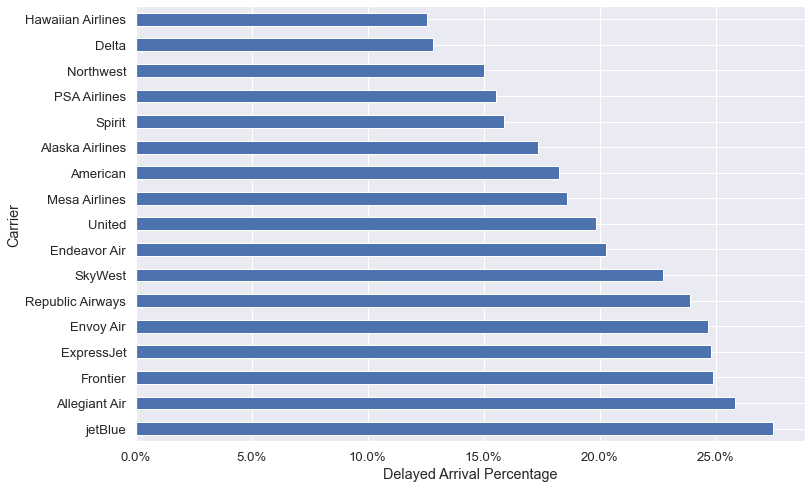

In [74]:
plt.figure(figsize=(12,8))
fig = df.groupby('OP_CARRIER').ARR_DEL15.mean().sort_values(ascending=False).plot.barh()
plt.ylabel('Carrier')
plt.xlabel('Delayed Arrival Percentage')
fig.xaxis.set_major_formatter(matplotlib.ticker.PercentFormatter(1))

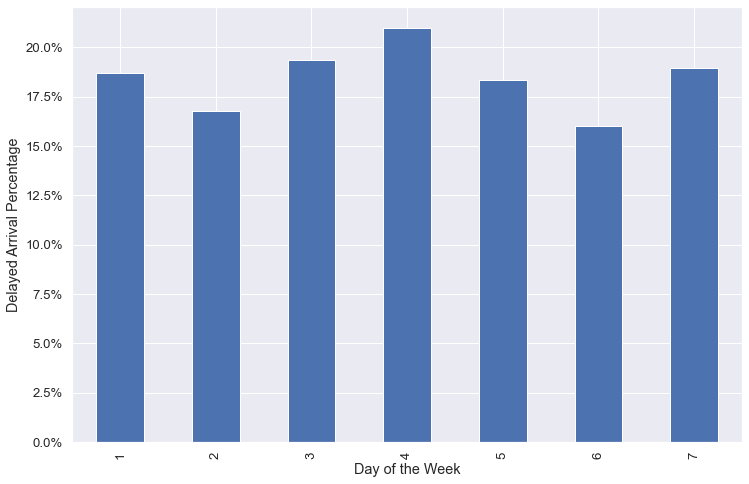

In [75]:
plt.figure(figsize=(12,8))
fig = df.groupby('DAY_OF_WEEK').ARR_DEL15.mean().plot.bar()
plt.ylabel('Delayed Arrival Percentage')
plt.xlabel('Day of the Week')
fig.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter(1))

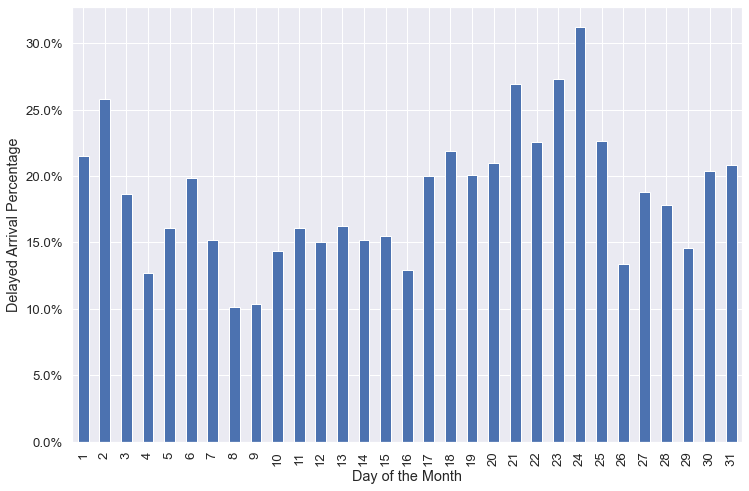

In [76]:
plt.figure(figsize=(12,8))
fig = df.groupby('DAY_OF_MONTH').ARR_DEL15.mean().plot.bar()
plt.ylabel('Delayed Arrival Percentage')
plt.xlabel('Day of the Month')
fig.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter(1))

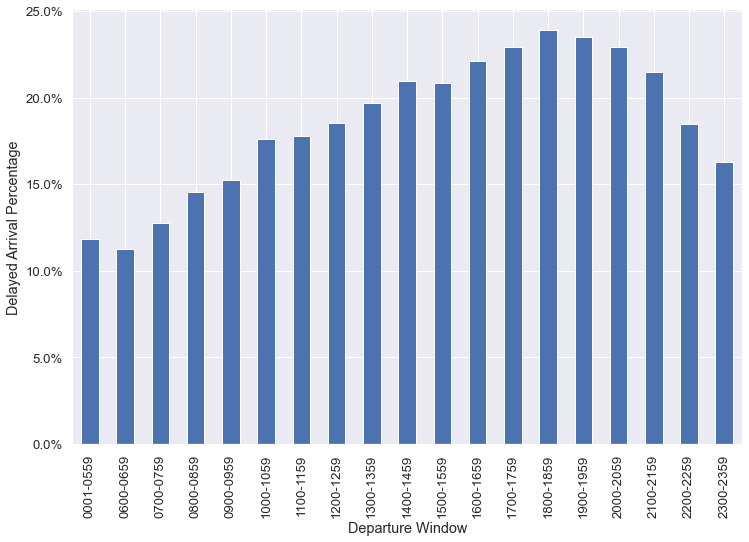

In [77]:
plt.figure(figsize=(12,8))
fig = df.groupby('DEP_TIME_BLK').ARR_DEL15.mean().plot.bar()
plt.ylabel('Delayed Arrival Percentage')
plt.xlabel('Departure Window')
fig.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter(1))

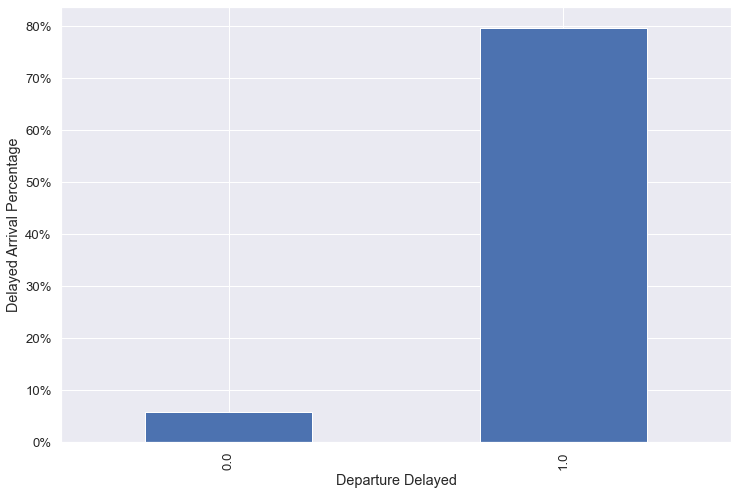

In [78]:
plt.figure(figsize=(12,8))
fig = df.groupby('DEP_DEL15').ARR_DEL15.mean().plot.bar()
plt.ylabel('Delayed Arrival Percentage')
plt.xlabel('Departure Delayed')
fig.yaxis.set_major_formatter(matplotlib.ticker.PercentFormatter(1))

# Modeling

In [14]:
#Define function for running classifier
def classifier(model, x_train, y_train, x_test, y_test, importance=True, scale=False, **params):
    
    #Define columns that will need to be one hot encoded
    encode_cols = ['DAY_OF_MONTH', 'DAY_OF_WEEK', 'OP_CARRIER', 'ORIGIN', 'DEST']
    
    #Create and fit model
    if scale:
        mod = Pipeline([('encode', OneHotEncoder(cols=encode_cols, return_df=True, use_cat_names = True)),
                        ('scale', StandardScaler()), ('model', model(**params))])        
    else:
        mod = Pipeline([('encode', OneHotEncoder(cols=encode_cols, return_df=True, use_cat_names = True)),
                        ('model', model(**params))])
    mod.fit(x_train, y_train)
    
    #Generate predictions
    train_preds = mod.predict(x_train)
    test_preds = mod.predict(x_test)
    
    #Display classification report on training and test data
    print('Training Performance')
    print(classification_report(y_train, train_preds))
    
    print('Testing Performance')
    print(classification_report(y_test, test_preds))
    
    metrics = classification_report(y_test, test_preds, output_dict=True)
    
    #Confusion Matrix
    cm = confusion_matrix(y_test, test_preds, normalize='all')
    sns.heatmap(cm, annot=True, cmap='Blues', fmt='.2%')
    plt.xlabel("Predicted")
    plt.ylabel("Actual")
    plt.title('Confusion Matrix')
    plt.show()
    
    if importance:
        #Calculate Permutation Feature Importance
        imp = permutation_importance(mod, x_test, y_test, scoring='f1', n_jobs=-1)

        #Create Feature Importance Plot
        plt.figure(figsize=(12,8))
        importance_data = pd.DataFrame({'feature':x_test.columns, 'importance':imp.importances_mean})
        sns.barplot(x='importance', y='feature', data=importance_data)
        plt.title('Permutation Feature Importance')
        plt.xlabel('Mean Decrease in F1 Score')
        plt.ylabel('')
        plt.show()
        
    #Return model, in case it needs to be used for anything else
    return mod, metrics['1.0']

In [15]:
x_cols = ['DAY_OF_MONTH', 'DAY_OF_WEEK', 'OP_CARRIER', 'ORIGIN', 'DEST', 'DEP_TIME', 'DISTANCE']
x_train, x_test, y_train, y_test = train_test_split(df[x_cols], df.ARR_DEL15, test_size=.4)

In [16]:
results = []

Training Performance
              precision    recall  f1-score   support

         0.0       0.89      0.65      0.75    276294
         1.0       0.30      0.64      0.40     63283

    accuracy                           0.65    339577
   macro avg       0.59      0.65      0.58    339577
weighted avg       0.78      0.65      0.69    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.88      0.65      0.75    184447
         1.0       0.29      0.62      0.40     41939

    accuracy                           0.65    226386
   macro avg       0.59      0.64      0.57    226386
weighted avg       0.77      0.65      0.69    226386



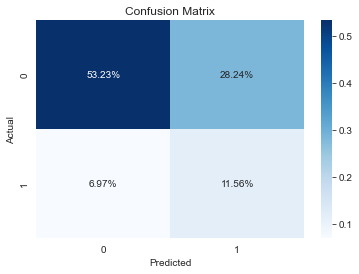

Wall time: 4min 36s


In [17]:
%%time
lr, metrics = classifier(LogisticRegression, x_train, y_train, x_test, y_test, False, True, n_jobs=-1, class_weight = 'balanced')
metrics['Model'] = 'Logistic Regression'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.84      0.86    276294
         1.0       0.40      0.48      0.44     63283

    accuracy                           0.77    339577
   macro avg       0.64      0.66      0.65    339577
weighted avg       0.79      0.77      0.78    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.87      0.83      0.85    184447
         1.0       0.37      0.44      0.40     41939

    accuracy                           0.76    226386
   macro avg       0.62      0.64      0.62    226386
weighted avg       0.77      0.76      0.76    226386



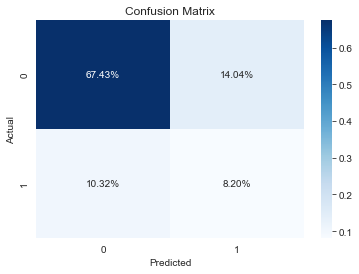

Wall time: 1min 1s


In [18]:
%%time
tree, metrics = classifier(DecisionTreeClassifier, x_train, y_train, x_test, y_test, False, False,
                         class_weight = 'balanced', max_depth=15)
metrics['Model'] = 'Decision Tree'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.63      0.73    276294
         1.0       0.28      0.63      0.39     63283

    accuracy                           0.63    339577
   macro avg       0.58      0.63      0.56    339577
weighted avg       0.77      0.63      0.67    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.88      0.63      0.73    184447
         1.0       0.28      0.63      0.38     41939

    accuracy                           0.63    226386
   macro avg       0.58      0.63      0.56    226386
weighted avg       0.77      0.63      0.67    226386



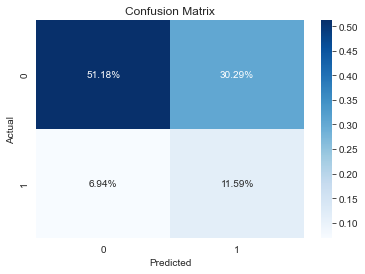

Wall time: 1min 6s


In [19]:
%%time
forest, metrics = classifier(RandomForestClassifier, x_train, y_train, x_test, y_test, False, False, n_jobs=-1, 
                         class_weight = 'balanced', min_weight_fraction_leaf=.005)
metrics['Model'] = 'Random Forest'
results.append(metrics)

[14:25:57] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.1/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Training Performance
              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91    276294
         1.0       0.84      0.22      0.35     63283

    accuracy                           0.85    339577
   macro avg       0.84      0.61      0.63    339577
weighted avg       0.85      0.85      0.81    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91    184447
         1.0       0.80      0.20      0.32     41939

    accuracy                           0.84    226386
   macro avg       0.82      0.60      0.62    226386
weighted avg       0.84      0.84      0.80    226

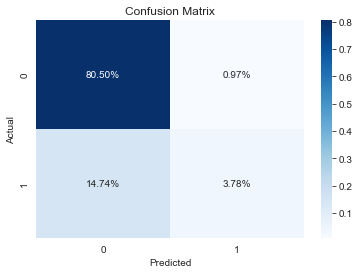

Wall time: 1min 59s


In [20]:
%%time
xgb, metrics = classifier(XGBClassifier, x_train, y_train, x_test, y_test, False, False, n_jobs=-1, use_label_encoder=False)
metrics['Model'] = 'XGBoost'
results.append(metrics)

## Hyperparameter tuning

In [21]:
#Take a random sample of the data for faster tuning
tuning_df = df.sample(50000, random_state=42)
tune_x = tuning_df[x_cols]
tune_y = tuning_df.ARR_DEL15

In [31]:
%%time
tree_params ={'tree__min_weight_fraction_leaf':[.001,.005, 0], 'tree__max_features':[.1,.5, None], 
             'tree__max_depth':range(15,35)}
tree_pipe = Pipeline([('encode', OneHotEncoder(cols=['DAY_OF_MONTH', 'DAY_OF_WEEK', 'OP_CARRIER', 'ORIGIN', 'DEST'], return_df=True)),
                    ('tree', DecisionTreeClassifier(class_weight='balanced'))])
tree_grid = GridSearchCV(estimator=tree_pipe, param_grid=tree_params, 
                           scoring='f1', n_jobs=-1, verbose=3)
tree_grid.fit(tune_x, tune_y)
best_tree_params = tree_grid.best_estimator_['tree'].get_params()
print(best_tree_params)

Fitting 5 folds for each of 180 candidates, totalling 900 fits
{'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': 26, 'max_features': None, 'max_leaf_nodes': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.005, 'random_state': None, 'splitter': 'best'}
Wall time: 23min 1s


In [23]:
%%time
xgb_params ={'xgb__learning_rate': [.1,.2], 'xgb__n_estimators': [50*i for i in range(5,10)], 'xgb__min_child_weight':[.01,.1,1]}
xgb_pipe = Pipeline([('encode', OneHotEncoder(cols=['DAY_OF_MONTH', 'DAY_OF_WEEK', 'OP_CARRIER', 'ORIGIN', 'DEST'], return_df=True)),
                    ('xgb', XGBClassifier(objective='reg:logistic', use_label_encoder=False, n_jobs=1))])
xgb_grid = GridSearchCV(estimator=xgb_pipe, param_grid=xgb_params, 
                           scoring='f1', n_jobs=-1, verbose=3, cv=3)
xgb_grid.fit(tune_x, tune_y)
best_xgb_params = xgb_grid.best_estimator_['xgb'].get_params()
print(best_xgb_params)

Fitting 3 folds for each of 30 candidates, totalling 90 fits
{'objective': 'reg:logistic', 'use_label_encoder': False, 'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'enable_categorical': False, 'gamma': 0, 'gpu_id': -1, 'importance_type': None, 'interaction_constraints': '', 'learning_rate': 0.2, 'max_delta_step': 0, 'max_depth': 6, 'min_child_weight': 0.01, 'missing': nan, 'monotone_constraints': '()', 'n_estimators': 450, 'n_jobs': 1, 'num_parallel_tree': 1, 'predictor': 'auto', 'random_state': 0, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'subsample': 1, 'tree_method': 'exact', 'validate_parameters': 1, 'verbosity': None}
Wall time: 47min 50s


In [24]:
%%time
forest_params ={'forest__min_weight_fraction_leaf':[.005,.01,.05,0], 'forest__n_estimators':[100, 150, 200,250]}
forest_pipe = Pipeline([('encode', OneHotEncoder(cols=['DAY_OF_MONTH', 'DAY_OF_WEEK', 'OP_CARRIER', 'ORIGIN', 'DEST'], return_df=True)),
                    ('forest', RandomForestClassifier(class_weight='balanced'))])
forest_grid = GridSearchCV(estimator=forest_pipe, param_grid=forest_params, 
                           scoring='f1', n_jobs=-1, verbose=3)
forest_grid.fit(tune_x, tune_y)
best_forest_params = forest_grid.best_estimator_['forest'].get_params()
print(best_forest_params)

Fitting 5 folds for each of 16 candidates, totalling 80 fits
{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced', 'criterion': 'gini', 'max_depth': None, 'max_features': 'auto', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.005, 'n_estimators': 200, 'n_jobs': None, 'oob_score': False, 'random_state': None, 'verbose': 0, 'warm_start': False}
Wall time: 9min 49s


## Try tuned parameters

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.62      0.73    276294
         1.0       0.28      0.64      0.39     63283

    accuracy                           0.63    339577
   macro avg       0.58      0.63      0.56    339577
weighted avg       0.77      0.63      0.67    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.88      0.62      0.73    184447
         1.0       0.27      0.63      0.38     41939

    accuracy                           0.62    226386
   macro avg       0.58      0.62      0.55    226386
weighted avg       0.77      0.62      0.66    226386



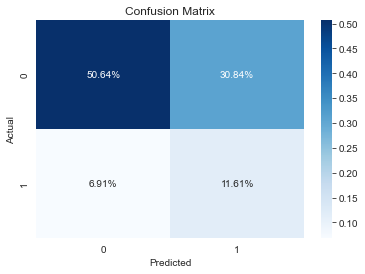

Wall time: 1min 6s


In [32]:
%%time
tuned_tree, metrics = classifier(DecisionTreeClassifier, x_train, y_train, x_test, y_test, False, False,
                         **best_tree_params)
metrics['Model'] = 'Decision Tree - Tuned'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.63      0.73    276294
         1.0       0.28      0.63      0.39     63283

    accuracy                           0.63    339577
   macro avg       0.58      0.63      0.56    339577
weighted avg       0.77      0.63      0.67    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.88      0.63      0.73    184447
         1.0       0.28      0.63      0.38     41939

    accuracy                           0.63    226386
   macro avg       0.58      0.63      0.56    226386
weighted avg       0.77      0.63      0.67    226386



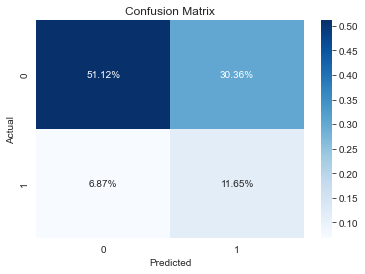

Wall time: 3min 22s


In [26]:
%%time
forest_tuned, metrics = classifier(RandomForestClassifier, x_train, y_train, x_test, y_test, False, False, **best_forest_params)
metrics['Model'] = 'Random Forest - Tuned'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.86      0.99      0.92    276294
         1.0       0.87      0.28      0.42     63283

    accuracy                           0.86    339577
   macro avg       0.86      0.63      0.67    339577
weighted avg       0.86      0.86      0.83    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.85      0.99      0.91    184447
         1.0       0.80      0.24      0.37     41939

    accuracy                           0.85    226386
   macro avg       0.82      0.61      0.64    226386
weighted avg       0.84      0.85      0.81    226386



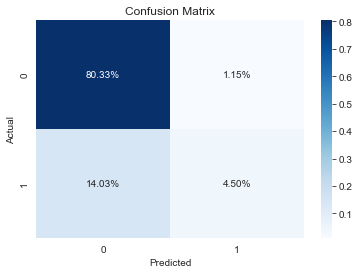

Wall time: 7min


In [28]:
%%time
best_xgb_params['n_jobs'] = -1
xgb_tuned, metrics = classifier(XGBClassifier, x_train, y_train, x_test, y_test, False, False, **best_xgb_params)
metrics['Model'] = 'XGBoost - Tuned'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88    276294
         1.0       0.46      0.46      0.46     63283

    accuracy                           0.80    339577
   macro avg       0.67      0.67      0.67    339577
weighted avg       0.80      0.80      0.80    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87    184447
         1.0       0.42      0.42      0.42     41939

    accuracy                           0.79    226386
   macro avg       0.65      0.65      0.65    226386
weighted avg       0.79      0.79      0.79    226386



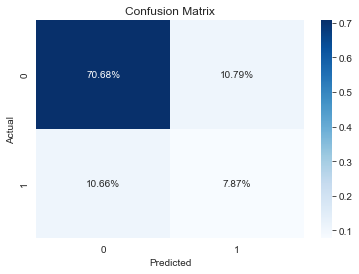

Wall time: 7min 31s


In [45]:
%%time
#Combine best models to create voting classifier

dt = DecisionTreeClassifier(class_weight = 'balanced', max_depth=15)
xg = XGBClassifier(**best_xgb_params)
lr = LogisticRegression(class_weight = 'balanced')
models = [('Tree', dt),('XGBoost', xg),('Logistic Regression', lr)]

voter_hard, metrics = classifier(VotingClassifier, x_train, y_train, x_test, y_test, False, True, 
                                estimators = models, n_jobs=-1, voting='hard')
metrics['Model'] = 'Voting Classifier - Hard Voting'
results.append(metrics)

Training Performance
              precision    recall  f1-score   support

         0.0       0.88      0.92      0.90    276294
         1.0       0.57      0.47      0.51     63283

    accuracy                           0.83    339577
   macro avg       0.72      0.69      0.71    339577
weighted avg       0.82      0.83      0.83    339577

Testing Performance
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89    184447
         1.0       0.50      0.41      0.45     41939

    accuracy                           0.82    226386
   macro avg       0.69      0.66      0.67    226386
weighted avg       0.80      0.82      0.81    226386



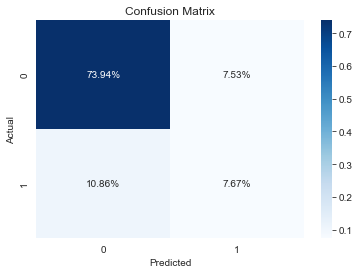

Wall time: 7min 59s


In [46]:
%%time
voter_soft, metrics = classifier(VotingClassifier, x_train, y_train, x_test, y_test, False, True, 
                                estimators = models, n_jobs=-1, voting='soft')
metrics['Model'] = 'Voting Classifier - Soft Voting'
results.append(metrics)

# Compare Model Performance

In [49]:
results_data = pd.DataFrame(results)[['Model', 'f1-score', 'precision', 'recall']].sort_values('f1-score', ascending=False)
results_data.style.hide_index()

Model,f1-score,precision,recall
Voting Classifier - Soft Voting,0.454653,0.504432,0.413815
Voting Classifier - Hard Voting,0.423124,0.421641,0.424617
Decision Tree,0.402397,0.368760,0.442786
Logistic Regression,0.396389,0.290440,0.624025
Random Forest - Tuned,0.384941,0.277354,0.628890
Random Forest,0.383726,0.276724,0.625647
Decision Tree - Tuned,0.380951,0.273597,0.626958
XGBoost - Tuned,0.372229,0.796870,0.242829
XGBoost,0.324864,0.795539,0.204106


# Examine results

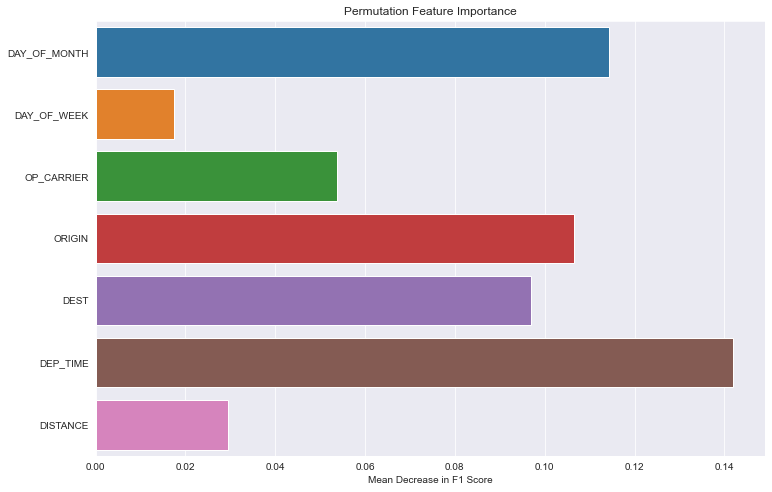

In [54]:
#Create permutation importance plot from the best model
imp = permutation_importance(voter_soft, tune_x, tune_y, scoring='f1', n_jobs=-1)
plt.figure(figsize=(12,8))
importance_data = pd.DataFrame({'feature':tune_x.columns, 'importance':imp.importances_mean})
sns.barplot(x='importance', y='feature', data=importance_data)
plt.title('Permutation Feature Importance')
plt.xlabel('Mean Decrease in F1 Score')
plt.ylabel('')
plt.show()

Wall time: 5min 38s


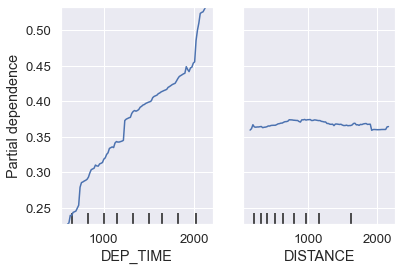

In [79]:
%%time
PartialDependenceDisplay.from_estimator(voter_soft, tune_x, [5,6])